# Exploratory data analysis

Understanding the relationships between the different set of variables in the dataset.

## Libraries

In [2]:
import numpy as np
import pandas as pd

from heatmap import heatmap, corrplot

from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
sns.set(color_codes=True, font_scale=1.2)

## Datasets

In [3]:
train_features = pd.read_csv("Data/train_features.csv")
test_features = pd.read_csv("Data/test_features.csv")
train_targets = pd.read_csv("Data/train_targets_scored.csv")

In [4]:
# Concatenate training and testing datasets of features
features = pd.concat([train_features, test_features])

## Relationships between experimental conditions and gene expressions

### Treatment type - gene expressions

In [5]:
# List of gene expressions for control and treatment perturbations
trt_ge = []
ctl_ge = []

# Populate lists
for i in range(len(features)):
    if features.iloc[i,1] == "trt_cp":
        for j in list(features.iloc[i,4:776]): # Gene expression data only
            trt_ge.append(j)
    if features.iloc[i,1] == "ctl_vehicle":
        for j in list(features.iloc[i,4:776]): # Gene expression data only
            ctl_ge.append(j)

# Transform lists into dataframes
trt_ge = pd.DataFrame(trt_ge)
trt_ge['cp_type'] = 'trt_cp'
ctl_ge = pd.DataFrame(ctl_ge)
ctl_ge['cp_type'] = 'ctl_vehicle'

# Descriptive statistcs
print(f"Control treatments: {ctl_ge.describe()}")
print(f"Drug treatments: {trt_ge.describe()}")

Control treatments:                   0
count  1.716928e+06
mean   1.459120e-02
std    9.672993e-01
min   -1.000000e+01
25%   -5.281000e-01
50%    1.000000e-02
75%    5.603000e-01
max    1.000000e+01
Drug treatments:                   0
count  1.974158e+07
mean   8.617355e-03
std    1.253330e+00
min   -1.000000e+01
25%   -4.879000e-01
50%    0.000000e+00
75%    5.016000e-01
max    1.000000e+01


In [10]:
# Concatenate treatment dataframes (first 500'000 data points of each to allow easier plotting)
treatments_ge = pd.concat([ctl_ge.iloc[:500000], trt_ge.iloc[:500000]])
treatments_ge.columns = ('Gene expression', 'cp_type')

# Overlaping violin plots
fig = px.violin(
    treatments_ge, 
    y="Gene expression", 
    color="cp_type",
    violinmode='overlay', 
    points= False, 
    template = "simple_white")

# Layout
fig.update_layout(
    autosize = False,
    width = 290,
    height = 400,
    legend_x = 0.6,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Gene expression",
    yaxis_zeroline=False)

#SVG export
fig.write_image("treatments-ge.svg")

### Dosage - gene expressions

In [19]:
# List of gene expressions for D1 and D2
D1_ge = []
D2_ge = []

# Populate lists
for i in range(len(features)):
    if features.iloc[i,3] == "D1":
        for j in list(features.iloc[i,4:776]): # Gene expression data only
            D1_ge.append(j)
    if features.iloc[i,3] == "D2":
        for j in list(features.iloc[i,4:776]): # Gene expression data only
            D2_ge.append(j)

# Transform lists into dataframes
D1_ge = pd.DataFrame(D1_ge)
D1_ge['cp_dose'] = 'D1'
D2_ge = pd.DataFrame(D2_ge)
D2_ge['cp_dose'] = 'D2'

# Descriptive statistcs
print(f"D1 treatments: {D1_ge.describe()}")
print(f"D2 treatments: {D2_ge.describe()}")

D1 treatments:                   0
count  1.094233e+07
mean   1.117583e-02
std    1.258367e+00
min   -1.000000e+01
25%   -4.957000e-01
50%    8.000000e-04
75%    5.157000e-01
max    1.000000e+01
D2 treatments:                   0
count  1.051618e+07
mean   6.930520e-03
std    1.205806e+00
min   -1.000000e+01
25%   -4.861000e-01
50%    0.000000e+00
75%    4.965000e-01
max    1.000000e+01


In [20]:
# Concatenate dataframes (first 500'000 data points of each to allow easier plotting)
dose_ge = pd.concat([D1_ge.iloc[:500000], D2_ge.iloc[:500000]])
dose_ge.columns = ('Gene expression', 'cp_dose')

# Overlaping violin plots
fig = px.violin(
    dose_ge, 
    y="Gene expression", 
    color="cp_dose",
    violinmode='overlay', 
    points= False, 
    template = "simple_white")

# Layout
fig.update_layout(
    autosize = False,
    width = 290,
    height = 400,
    legend_x = 0.6,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Gene expression",
    yaxis_zeroline=False)

#SVG export
fig.write_image("dose-ge.svg")

In [23]:
# List of gene expressions for 24, 48 and 72 hours
T1_ge = []
T2_ge = []
T3_ge = []

# Populate lists
for i in range(len(features)):
    if features.iloc[i,2] == 24:
        for j in list(features.iloc[i,4:776]): # Gene expression data only
            T1_ge.append(j)
    if features.iloc[i,2] == 48:
        for j in list(features.iloc[i,4:776]): # Gene expression data only
            T2_ge.append(j)
    if features.iloc[i,2] == 72:
        for j in list(features.iloc[i,4:776]): # Gene expression data only
            T3_ge.append(j)

# Transform lists into dataframes
T1_ge = pd.DataFrame(T1_ge)
T1_ge['cp_time'] = '24'
T2_ge = pd.DataFrame(T2_ge)
T2_ge['cp_time'] = '48'
T3_ge = pd.DataFrame(T3_ge)
T3_ge['cp_time'] = '72'

# Descriptive statistcs
print(f"24 hour treatments: {T1_ge.describe()}")
print(f"48 hour treatments: {T2_ge.describe()}")
print(f"72 hour treatments: {T3_ge.describe()}")

24 hour treatments:                   0
count  7.003584e+06
mean   9.442087e-03
std    1.176233e+00
min   -1.000000e+01
25%   -4.897000e-01
50%    7.000000e-04
75%    5.069000e-01
max    1.000000e+01
48 hour treatments:                   0
count  7.432044e+06
mean   8.622947e-03
std    1.243764e+00
min   -1.000000e+01
25%   -4.900000e-01
50%    0.000000e+00
75%    5.046000e-01
max    1.000000e+01
72 hour treatments:                   0
count  7.022884e+06
mean   9.249434e-03
std    1.275789e+00
min   -1.000000e+01
25%   -4.933000e-01
50%    0.000000e+00
75%    5.070000e-01
max    1.000000e+01


In [24]:
# Concatenate dataframes (first 500'000 data points of each to allow easier plotting)
time_ge = pd.concat([T1_ge.iloc[:500000], T2_ge.iloc[:500000], T3_ge.iloc[:500000]])
time_ge.columns = ('Gene expression', 'cp_time')

# Overlaping violin plots
fig = px.violin(
    time_ge, 
    y="Gene expression", 
    color="cp_time",
    violinmode='overlay', 
    points= False, 
    template = "simple_white")

# Layout
fig.update_layout(
    autosize = False,
    width = 290,
    height = 400,
    legend_x = 0.6,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Gene expression",
    yaxis_zeroline=False)

#SVG export
fig.write_image("time-ge.svg")

### Treatment time - gene expressions

## Relationships between experimental conditions and cell viabilities

### Treatment type - cell viabilities

In [6]:
# List of gene expressions for control and treatment perturbations
trt_cv = []
ctl_cv = []

# Populate lists
for i in range(len(features)):
    if features.iloc[i,1] == "trt_cp":
        for j in list(features.iloc[i,776:876]): # Cell viability data only
            trt_cv.append(j)
    if features.iloc[i,1] == "ctl_vehicle":
        for j in list(features.iloc[i,776:876]): #  Cell viability data only
            ctl_cv.append(j)

# Transform lists into dataframes
trt_cv = pd.DataFrame(trt_cv)
trt_cv['cp_type'] = 'trt_cp'
ctl_cv = pd.DataFrame(ctl_cv)
ctl_cv['cp_type'] = 'ctl_vehicle'

# Descriptive statistcs
print(f"Control treatments: {ctl_cv.describe()}")
print(f"Drug treatments: {trt_cv.describe()}")

Control treatments:                    0
count  222400.000000
mean        0.168262
std         0.734511
min       -10.000000
25%        -0.247400
50%         0.217300
75%         0.644000
max         3.888000
Drug treatments:                   0
count  2.557200e+06
mean  -4.785551e-01
std    1.962555e+00
min   -1.000000e+01
25%   -5.867000e-01
50%   -2.295000e-02
75%    4.409000e-01
max    6.412000e+00


In [7]:
# Concatenate treatment dataframes
treatments_cv = pd.concat([ctl_cv, trt_cv])
treatments_cv.columns = ('Cell viability', 'cp_type')

# Overlaping violin plots
fig = px.violin(
    treatments_cv, 
    y="Cell viability", 
    color="cp_type",
    violinmode='overlay', 
    points= False, 
    template = "simple_white")

# Layout
fig.update_layout(
    autosize = False,
    width = 290,
    height = 400,
    legend_x = 0.6,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Cell viability",
    yaxis_zeroline=False)

#SVG export
fig.write_image("treatments-cv.svg")

### Dosage - cell viabilities

In [9]:
# List of cell viabilities for D1 and D2
D1_cv = []
D2_cv = []

# Populate lists
for i in range(len(features)):
    if features.iloc[i,3] == "D1":
        for j in list(features.iloc[i,776:876]): # Cell viability data only
            D1_cv.append(j)
    if features.iloc[i,3] == "D2":
        for j in list(features.iloc[i,776:876]): # Cell viability  data only
            D2_cv.append(j)

# Transform lists into dataframes
D1_cv = pd.DataFrame(D1_cv)
D1_cv['cp_dose'] = 'D1'
D2_cv = pd.DataFrame(D2_cv)
D2_cv['cp_dose'] = 'D2'

# Descriptive statistcs
print(f"D1 treatments: {D1_cv.describe()}")
print(f"D2 treatments: {D2_cv.describe()}")

D1 treatments:                   0
count  1.417400e+06
mean  -4.801937e-01
std    2.012973e+00
min   -1.000000e+01
25%   -5.715000e-01
50%    1.700000e-03
75%    4.649000e-01
max    6.099000e+00
D2 treatments:                   0
count  1.362200e+06
mean  -3.712473e-01
std    1.777386e+00
min   -1.000000e+01
25%   -5.430000e-01
50%   -7.200000e-03
75%    4.536000e-01
max    6.412000e+00


In [1]:
# Concatenate dataframes 
dose_cv = pd.concat([D1_cv, D2_cv])
dose_cv.columns = ('Cell viability', 'cp_dose')

# Overlaping violin plots
fig = px.violin(
    dose_cv, 
    y="Cell viability", 
    color="cp_dose",
    violinmode='overlay', 
    points= False, 
    template = "simple_white")

# Layout
fig.update_layout(
    autosize = False,
    width = 290,
    height = 400,
    legend_x = 0.6,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Cell viability",
    yaxis_zeroline=False)

#SVG export
fig.write_image("dose-cv.svg")

NameError: name 'pd' is not defined

### Time - cell viability

In [28]:
# List of gene expressions for 24, 48 and 72 hours
T1_cv = []
T2_cv = []
T3_cv = []

# Populate lists
for i in range(len(features)):
    if features.iloc[i,2] == 24:
        for j in list(features.iloc[i,776:876]): # Cell viability data only
            T1_cv.append(j)
    if features.iloc[i,2] == 48:
        for j in list(features.iloc[i,776:876]): # Cell viability data only
            T2_cv.append(j)
    if features.iloc[i,2] == 72:
        for j in list(features.iloc[i,776:876]): # Cell viability data only
            T3_cv.append(j)

# Transform lists into dataframes
T1_cv = pd.DataFrame(T1_cv)
T1_cv['cp_time'] = '24'
T2_cv = pd.DataFrame(T2_cv)
T2_cv['cp_time'] = '48'
T3_cv = pd.DataFrame(T3_cv)
T3_cv['cp_time'] = '72'

# Descriptive statistcs
print(f"24 hour treatments: {T1_cv.describe()}")
print(f"48 hour treatments: {T2_cv.describe()}")
print(f"72 hour treatments: {T3_cv.describe()}")

24 hour treatments:                    0
count  907200.000000
mean       -0.263870
std         1.465513
min       -10.000000
25%        -0.536600
50%        -0.009800
75%         0.458700
max         6.412000
48 hour treatments:                    0
count  962700.000000
mean       -0.436999
std         1.938462
min       -10.000000
25%        -0.560300
50%        -0.005200
75%         0.459000
max         6.024000
72 hour treatments:                    0
count  909700.000000
mean       -0.578496
std         2.210221
min       -10.000000
25%        -0.577200
50%         0.007100
75%         0.460500
max         4.929000


In [29]:
# Concatenate dataframes 
time_cv = pd.concat([T1_cv, T2_cv, T3_cv])
time_cv.columns = ('Cell viability', 'cp_time')

# Overlaping violin plots
fig = px.violin(
    time_cv, 
    y="Cell viability", 
    color="cp_time",
    violinmode='overlay', 
    points= False, 
    template = "simple_white",)

# Layout
fig.update_layout(
    autosize = False,
    width = 290,
    height = 400,
    legend_x = 0.6,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Cell viability",
    yaxis_zeroline=False)

#SVG export
fig.write_image("time-cv.svg")

## Correlations between gene expression and cell viability

In [30]:
# Obtianing a dataframe of the correlations between gene expression and cell viability variables
corr = features.corr()
ge_cv_corr = corr.iloc[773:874,1:773]

# List of correlations
ge_cv_correlations_list = []

for i in range(len(ge_cv_corr)):
    for j in list(ge_cv_corr.iloc[i,]): 
        ge_cv_correlations_list.append(j)

In [31]:
# Calculating the number of correlations above with a correlation coefficient (CC) above 0.2, 0.4, 0.6 and 0.8
ge_cv_correlations_2 = list(filter(lambda a: a < 0.2 and a > -0.2, ge_cv_correlations_list)) 
ge_cv_correlations_4 = list(filter(lambda a: a < 0.4 and a > -0.4, ge_cv_correlations_list)) 
ge_cv_correlations_6 = list(filter(lambda a: a < 0.6 and a > -0.6, ge_cv_correlations_list)) 
ge_cv_correlations_8 = list(filter(lambda a: a < 0.8 and a > -0.8, ge_cv_correlations_list)) 


print(f"Number of correlations (CC < 0.2): {len(ge_cv_correlations_2)}")
print(f"Percent of correlations (CC < 0.2): {round(len(ge_cv_correlations_2)/len(ge_cv_correlations_list)*100, 1)}")

print(f"Number of correlations (0.2 < CC < 0.4): {len(ge_cv_correlations_4) - len(ge_cv_correlations_2)}")
print(f"Percent of correlations (0.2 < CC < 0.4): {round((len(ge_cv_correlations_4)- len(ge_cv_correlations_2))/len(ge_cv_correlations_list)*100, 1)}")

print(f"Number of correlations (0.4 < CC < 0.6): {len(ge_cv_correlations_6) - len(ge_cv_correlations_4)}")
print(f"Percent of correlations (0.4 < CC < 0.6): {round((len(ge_cv_correlations_6)- len(ge_cv_correlations_4))/len(ge_cv_correlations_list)*100, 1)}")

print(f"Number of correlations (0.6 < CC < 0.8): {len(ge_cv_correlations_8) - len(ge_cv_correlations_6)}")
print(f"Percent of correlations (0.6 < CC < 0.8): {round((len(ge_cv_correlations_8)- len(ge_cv_correlations_6))/len(ge_cv_correlations_list)*100, 1)}")

Number of correlations (CC < 0.2): 22212
Percent of correlations (CC < 0.2): 28.8
Number of correlations (0.2 < CC < 0.4): 21733
Percent of correlations (0.2 < CC < 0.4): 28.2
Number of correlations (0.4 < CC < 0.6): 21179
Percent of correlations (0.4 < CC < 0.6): 27.4
Number of correlations (0.6 < CC < 0.8): 11670
Percent of correlations (0.6 < CC < 0.8): 15.1


[Text(0.5, 0, 'g-0'),
 Text(4.5, 0, 'g-4'),
 Text(8.5, 0, 'g-8'),
 Text(12.5, 0, 'g-12'),
 Text(16.5, 0, 'g-16'),
 Text(20.5, 0, 'g-20'),
 Text(24.5, 0, 'g-24'),
 Text(28.5, 0, 'g-28'),
 Text(32.5, 0, 'g-32'),
 Text(36.5, 0, 'g-36'),
 Text(40.5, 0, 'g-40'),
 Text(44.5, 0, 'g-44'),
 Text(48.5, 0, 'g-48'),
 Text(52.5, 0, 'g-52'),
 Text(56.5, 0, 'g-56'),
 Text(60.5, 0, 'g-60'),
 Text(64.5, 0, 'g-64'),
 Text(68.5, 0, 'g-68'),
 Text(72.5, 0, 'g-72'),
 Text(76.5, 0, 'g-76'),
 Text(80.5, 0, 'g-80'),
 Text(84.5, 0, 'g-84'),
 Text(88.5, 0, 'g-88'),
 Text(92.5, 0, 'g-92'),
 Text(96.5, 0, 'g-96'),
 Text(100.5, 0, 'g-100'),
 Text(104.5, 0, 'g-104'),
 Text(108.5, 0, 'g-108'),
 Text(112.5, 0, 'g-112'),
 Text(116.5, 0, 'g-116'),
 Text(120.5, 0, 'g-120'),
 Text(124.5, 0, 'g-124'),
 Text(128.5, 0, 'g-128'),
 Text(132.5, 0, 'g-132'),
 Text(136.5, 0, 'g-136'),
 Text(140.5, 0, 'g-140'),
 Text(144.5, 0, 'g-144'),
 Text(148.5, 0, 'g-148'),
 Text(152.5, 0, 'g-152'),
 Text(156.5, 0, 'g-156'),
 Text(160.5, 0, 

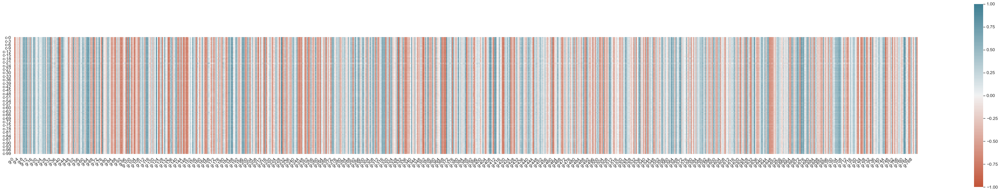

In [32]:
# Correlation matrix plot (not used in HTML page)
fig, ax = plt.subplots()
fig.set_size_inches(60, 10)


sns.heatmap(
    ge_cv_corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True, ax = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

In [33]:
fig = go.Figure() 

# Histogram trace
fig.add_trace(
    go.Histogram(
        x=ge_cv_correlations_list, 
        nbinsx = 150))

# Layout
fig.update_layout(autosize=False,
    width=400,
    height=300,
    showlegend=False,     
    margin={'l': 20, 'r': 20, 't':  20, 'b': 20},
    template="simple_white",
    xaxis_title = "Correlation coefficient",
    yaxis_title = "Count",
    xaxis_range = [-1,1])
    
#HTML export
fig.write_html(file="ge_cv_correlations.html",include_plotlyjs="directory",full_html=True)

## Relationship between experimental conditions and number of MoAs

In [34]:
# Merge training features and targets data
training = pd.merge(train_features, train_targets, on = 'sig_id')

# Add sum of MoA column
training['moa_sum'] = "0"

for i in range(len(training)):
    moa_sum = training.iloc[i,876:1082].sum()
    if moa_sum == 1:
        training["moa_sum"][i] = "1"
    if moa_sum > 1:
        training["moa_sum"][i] = "> 2"

# Sort dataframe by sum of MoA
training = training.sort_values(by=['moa_sum'])

ipykernel_launcher:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

ipykernel_launcher:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Treatment type - number of MoAs

In [35]:
# Histogram plot
fig = px.histogram(
    training, 
    x = "moa_sum", 
    color="cp_type",
    barmode="overlay",
    template="simple_white",
    histnorm = "percent")

# Layout   
fig.update_layout(
    autosize=False,
    width = 290,
    height = 400,    
    legend_x = 0.5,
    legend_y = 1,
    margin={'l': 20, 'r': 20, 't':  20, 'b': 20},
    xaxis_title = "Number of MoA",
    yaxis_title = "Treatments percent",
    xaxis_dtick = 1,
    xaxis_type = 'category')


#HTML export
fig.write_html(file="Type-MoAs.html",include_plotlyjs="directory",full_html=True)

### Treatment dose - number of MoAs

In [36]:
# Histogram plot
fig = px.histogram(
    training, 
    x = "moa_sum", 
    color="cp_dose",
    barmode="overlay",
    template="simple_white",
    histnorm = "percent")

# Layout   
fig.update_layout(
    autosize=False,
    width = 290,
    height = 400,    
    legend_x = 0.65,
    legend_y = 1,
    margin={'l': 20, 'r': 20, 't':  20, 'b': 20},
    xaxis_title = "Number of MoA",
    yaxis_title = "Treatments percent",
    xaxis_dtick = 1,
    xaxis_type = 'category')


#HTML export
fig.write_html(file="Dose-MoAs.html",include_plotlyjs="directory",full_html=True)

### Treatment time - number of MoAs

In [37]:
# Histogram plot
fig = px.histogram(
    training, 
    x = "moa_sum", 
    color="cp_time",
    barmode="overlay",
    template="simple_white",
    histnorm = "percent")

# Layout   
fig.update_layout(
    autosize=False,
    width = 290,
    height = 400,    
    legend_x = 0.65,
    legend_y = 1,
    margin={'l': 20, 'r': 20, 't':  20, 'b': 20},
    xaxis_title = "Number of MoA",
    yaxis_title = "Treatments percent",
    xaxis_dtick = 1,
    xaxis_type = 'category')


#HTML export
fig.write_html(file="Time-MoAs.html",include_plotlyjs="directory",full_html=True)

## Relationship between gene expressions and number of MoAs

In [38]:
# List of gene expressions for treatments with 0, 1 or more than 2 mechanisms of action
moa0_ge = []
moa1_ge = []
moa2_ge = []

# Populate lists
for i in range(len(training)):
    if training.iloc[i,1082] == "0":
        for j in list(training.iloc[i,4:776]):
            moa0_ge.append(j)
    if training.iloc[i,1082] == "1":
        for j in list(training.iloc[i,4:776]):
            moa1_ge.append(j)
    if training.iloc[i,1082] == "> 2":
        for j in list(training.iloc[i,4:776]):
            moa2_ge.append(j)

# Transform lists into dataframes
moa0_ge = pd.DataFrame(moa0_ge)
moa0_ge['MoA number'] = '0'
moa1_ge = pd.DataFrame(moa1_ge)
moa1_ge['MoA number'] = '1'
moa2_ge = pd.DataFrame(moa2_ge)
moa2_ge['MoA number'] = '> 2'

# Descriptive statistcs
print(f"0 MoAs treatments: {moa0_ge.describe()}")
print(f"1 MoAs treatments: {moa1_ge.describe()}")
print(f"2+ MoAs treatments: {moa2_ge.describe()}")

0 MoAs treatments:                   0
count  7.231324e+06
mean   8.477629e-03
std    1.007347e+00
min   -1.000000e+01
25%   -4.739000e-01
50%    0.000000e+00
75%    4.882000e-01
max    1.000000e+01
1 MoAs treatments:                   0
count  9.674704e+06
mean   9.444229e-03
std    1.089088e+00
min   -1.000000e+01
25%   -4.786000e-01
50%    4.000000e-04
75%    4.947000e-01
max    1.000000e+01
2+ MoAs treatments:                   0
count  1.478380e+06
mean   8.767070e-03
std    2.504945e+00
min   -1.000000e+01
25%   -7.829000e-01
50%    0.000000e+00
75%    7.953250e-01
max    1.000000e+01


In [39]:
# Concatenate dataframes (first 500'000 data points of each to allow easier plotting)
moa_ge = pd.concat([moa0_ge.iloc[:500000], moa1_ge.iloc[:500000], moa2_ge.iloc[:500000]])
moa_ge.columns = ('Gene expression', 'moa_sum')

# Overlaping violin plots
fig = px.violin(
    moa_ge, 
    y ="Gene expression", 
    color="moa_sum",
    template = "simple_white", 
    points = False)

# Layout
fig.update_layout(
    autosize = False,
    width = 400,
    height = 400,
    legend_x = 0.8,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Gene expression",
    yaxis_zeroline=False)

#SVG export
fig.write_image("Ge-MoAs.svg")

## Relationship between cell viability and number of MoAs

In [40]:
# List of gene expressions for treatments with 0, 1 or more than 2 mechanisms of action
moa0_cv = []
moa1_cv = []
moa2_cv = []

# Populate lists
for i in range(len(training)):
    if training.iloc[i,1082] == "0":
        for j in list(training.iloc[i,776:876]): 
            moa0_cv.append(j)
    if training.iloc[i,1082] == "1":
        for j in list(training.iloc[i,776:876]):
            moa1_cv.append(j)
    if training.iloc[i,1082] == "> 2":
        for j in list(training.iloc[i,776:876]):
            moa2_cv.append(j)

# Transform lists into dataframes
moa0_cv = pd.DataFrame(moa0_cv)
moa0_cv['MoA number'] = '0'
moa1_cv = pd.DataFrame(moa1_cv)
moa1_cv['MoA number'] = '1'
moa2_cv = pd.DataFrame(moa2_cv)
moa2_cv['MoA number'] = '> 2'

# Descriptive statistcs
print(f"0 MoAs treatments: {moa0_cv.describe()}")
print(f"1 MoAs treatments: {moa1_cv.describe()}")
print(f"2+ MoAs treatments: {moa2_cv.describe()}")

0 MoAs treatments:                    0
count  936700.000000
mean       -0.140942
std         1.234367
min       -10.000000
25%        -0.454600
50%         0.049500
75%         0.492900
max         6.412000
1 MoAs treatments:                   0
count  1.253200e+06
mean  -2.186025e-01
std    1.327171e+00
min   -1.000000e+01
25%   -5.186000e-01
50%    5.000000e-03
75%    4.585000e-01
max    5.263000e+00
2+ MoAs treatments:                    0
count  191500.000000
mean       -3.255050
std         4.177053
min       -10.000000
25%        -7.708000
50%        -0.766100
75%         0.161100
max         4.134000


In [41]:
# Concatenate dataframes 
moa_cv = pd.concat([moa0_cv, moa1_cv, moa2_cv])
moa_cv.columns = ('Cell viability', 'moa_sum')

# Overlaping violin plots
fig = px.violin(
    moa_cv, 
    y ="Cell viability", 
    color="moa_sum",
    template = "simple_white", 
    points = False)

# Layout
fig.update_layout(
    autosize = False,
    width = 400,
    height = 400,
    legend_x = 0.8,
    legend_y = 1,
    margin = {'l': 20, 'r': 20, 't':  20, 'b': 20},
    yaxis_title = "Cell viability",
    yaxis_zeroline=False)

#SVG export
fig.write_image("CV-MoAs.svg")